# **1. Author**

**Student Name: Nikhil Jawade**

**Student ID: 210987533**

# **2. Problem Formulation**

With the use of MLEnd Hums and Whistles audio data along with Demographic data, this machine learning pipeline that takes an input as a hum of any of the 8 songs and predicts whether the voice is feminine or masculine.

# **3. Machine Learning Pipeline**

The Machine Learning Pipeline is represented as follows:

**Data Extraction --> Transformation --> Model --> Model Evaluation**

### **Data Extraction:**

**Input:** The '.wav' audio format inputs are taken from MLEnd Hums and Whistles dataset, totalling 3330 combined samples. As Demographic data is also being used, the metadata further gets merged with demographic.

### **Transformation:**

***Feature Extraction:*** Extraction of spectrum and different statistical properties of spectral features such as mean, standard deviation, mode, interquartile range of amplitude, and few others.

***Feature Selection:*** Selection of above mentioned features is carried out based on Standard Correlation Coefficient and dropping highly correlated features.

***Linear Tranformation:***The extracted features are then Normalized.

***Label Encoding:*** From demographic data, taking the values which contains gender as 'Male' and 'Female' and labelling them as 1 and 0 respectively.


### **Models:**

A K-Nearest Neighbour Classification, Random Forrest Classifier, and Support Vector Machine as the final estimator has been used as a model for prediction on the dataset.

**Output:** Transformed data is split and passed to the Machine Learning models for training and validation.

### **Model Evaluation:**

Model validation performance evaluated using accuracy, classification metrics (f-score, precision and recall).

# **4. Transformation Stage:**



The following was undertaken as a part of Transformation of Data:

***Feature Extraction and Selection:***

The input data is in '.wav' format. To reduce dimensionality, features are extracted using signal processing functions from the Librosa library. Extraction of spectrum and different statistical properties of a spectral sample is as follows:

1. Mean
2. Standard Deviation
3. Median
4. Mode
5. First Quartile Mean
6. Third Quartile Mean
7. Interquartile Range
8. Skew
9. Unbiased Kurtosis

The features extracted results in a 2-D vector of input values and 9 features for Dataset1 and a 2-D vector of input values and 2 features, First Quartile Mean and Mode.

***Linear Tranformation:***

The extracted features are then Normalized (MinMaxScaler). Normalization (MinMaxScalar) scales each input variable separately to the range 0-1, which is the range for floating-point values where we have the most precision.

***Label Encoding:***

From demographic data, taking the values which contains gender as 'Male' and 'Female' and labelling them as 1 and 0 respectively which outputs a 1D array.

# **5. Modelling**

The following models are chosen to be implemented:

1. K-Nearest Neighbors Classifier
2. Random Forrest Classifier
3. Support Vector Machine (SVM) Classifier

# **6. Methodology**

The methodology behind how the data is trained, validated and assessed is described below:

***Data Split:***
The data is split using the sklearn's train_test_split() method. The split iss performed over as 70% training data and 30% validation data.

***Predictors and Labels:***
A 2-D vector of features obtained from Transformation Stage are used as predictors and 'Male', 'Female' are used as y-labels for the binary classification.

***Model Training:*** The models are trainined on the 70% of data ie training dataset. K-Nearest Neighbors Classifier, Random Forrest Classifier and Support Vector Machine (SVM) classification algorithms were used.

***Model Peformance:*** The models are validated on the 30% data to assess its performance. Each model performance is then compared using a accuracy, confusion matrix classification metrics (f-score, precision and recall). Precision is the ratio of true positives to the sum of true and false positives while recall is the ratio of tru positives to the sum of true and false negatives. f-score is their mean.

# **7. Dataset**

As the data is a '.wav' audio file and the other information about the audio file can be extracted from its file name. Hence following procedures are followed in sequece  to pre-process the data and later fix the inconsistencies in its nomenclature to gain a metadata about the audio files.


In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import os, sys, re, pickle, glob
import urllib.request
import zipfile
import IPython.display as ipd
from tqdm import tqdm
import librosa

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, MinMaxScaler, LabelEncoder
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
import seaborn as sns

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Data-Preprocessing**

In [ ]:
def download_url(url, save_path):
  with urllib.request.urlopen(url) as dl_file:
    with open(save_path, 'wb') as out_file:
      out_file.write(dl_file.read())

def unzip_data(zip_path, directory):
  with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory)

### **Data download and storage**

The next step is to download all the zip files related to this task into the folder 'MyDrive/Data/MLEndHW'. 

Note: Create a folder '/content/drive/MyDrive/Data/MLEndHW/Task2/' in Google Drive.

In [ ]:
drive_loc = '/content/drive/MyDrive/Data/MLEndHW/'

#Following links have expired
urls_train = [{'name': 'Potter_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=6P0I5CAE7JPPKNDU/4P729FD6DFNO8IT4NNFR458'},
        {'name': 'StarWars_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=4HOGB7IH67J8QGL3/5D5TJMIP30DFVC69AQU5ETO'},
        {'name': 'Panther_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=6P5DHMOKUOST11V4/45V197K56GJCN375FM97GKO'},
        {'name': 'Rain_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=610DVT8AV0VTD6FQ/4PSHB4CI8V5Q0LTGMBBBVO0'},
        {'name': 'Hakuna_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=555I92D6GH5I5L9M/59UH97479B4AQOLUKB0QI08'},
        {'name': 'Mamma_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=554DRGJTDMH4I3JF/595DLIDADVHOGJTBM3BRS68'},
        {'name': 'Showman_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=5942PCQC7ROPGNTS/6PF33CLHC39AEQ41JJS9AC8'},
        {'name': 'Frozen_Part1', 'url': 'https://collect.qmul.ac.uk/down?t=4LV194DEJH9JLV8U/652DJI5BDRM82DIIPKKCFQ0'}]

urls_test = [{'name': 'Potter_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=452THMOKUOST11V4/4L7IBFL5AJ3AMR45JVV9AC0'},
        {'name': 'StarWars_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=4LUHB7IH67J8QGL3/6T5IF3SK8KQTL7FRD2113DO'},
        {'name': 'Panther_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=556JF9IP9676AAIB/450D7KAI0S5U15VGE2A7MKO'},
        {'name': 'Rain_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=5163F9QO9A6M8AQ8/6P0T9MQO34CVTCEEA6K4AR8'},
        {'name': 'Hakuna_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=6TF3DEBMAIDN49A6/6L4DRTRS7KUT51CTGADNEN8'},
        {'name': 'Mamma_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=4HVHB72J6VS9UK5D/610DRSJH409EFA60BQVQQ20'},
        {'name': 'Showman_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=6132RDI977V9AMLR/6L7J7ETOF7SPSKDEMB5Q81G'},
        {'name': 'Frozen_Part2', 'url': 'https://collect.qmul.ac.uk/down?t=6TDILDI977V9AMLR/6P4TPGT0A70LC6BHTK7VPMG'}]

save_paths_train = []
save_paths_test = []

for i in urls_train:
  save_paths_train.append(drive_loc + 'Task2/Train/' + i['name'] + '.zip')

for i in urls_test:
  save_paths_test.append(drive_loc + 'Task2/Test/' + i['name'] + '.zip')

In [ ]:
for i in tqdm(range(len(urls_train))):
  temp_dict = urls_train[i]
  download_url(temp_dict['url'], save_paths_train[i])

In [ ]:
for i in tqdm(range(len(urls_test))):
  temp_dict = urls_test[i]
  download_url(temp_dict['url'], save_paths_test[i])

100%|██████████| 8/8 [00:04<00:00,  1.99it/s]


Run the following cell to check that the Task1 folder contains the file 8 '.zip' files named:

In [ ]:
path = '/content/drive/MyDrive/Data/MLEndHW/Task2/Test/'
os.listdir(path)

['Potter_Part2.zip',
 'StarWars_Part2.zip',
 'Panther_Part2.zip',
 'Rain_Part2.zip',
 'Hakuna_Part2.zip',
 'Mamma_Part2.zip',
 'Showman_Part2.zip',
 'Frozen_Part2.zip']

The following cell will extract all 8 '.zip' files into the location defined in 'directory_to_extract_train'

In [ ]:
directory_to_extract_train = '/content/drive/MyDrive/Data/MLEndHW/Task2/TrainData/'

for i in tqdm(save_paths_train):
  unzip_data(i, directory_to_extract_train)

In [ ]:
directory_to_extract_test = '/content/drive/MyDrive/Data/MLEndHW/Task2/TestData/'

for i in tqdm(save_paths_test):
  unzip_data(i, directory_to_extract_test)

100%|██████████| 8/8 [02:35<00:00, 19.42s/it]


Importing all the files in the path to a 'files' object. There are 1687 audio files in the folder. 

In [ ]:
path_train = '/content/drive/MyDrive/Data/MLEndHW/Task2/TrainData/*'
files_train = glob.glob(path_train)
print(f'Total number of files : {len(files_train)}\n')

for _ in range(5):
  n = np.random.randint(1687)
  display(ipd.Audio(files_train[n]))

Total number of files : 1687



In [ ]:
path_test = '/content/drive/MyDrive/Data/MLEndHW/Task2/TestData/*'
files_test = glob.glob(path_test)
print(f'Total number of files : {len(files_test)}\n')

### **Creating Meta-data and Fixing inconsistencies:**

Creating a Data Frame to store the metadata that can be retrieved from the audio file names. With it, the inconsistencies in data and its recognition can be resolved.

In [ ]:
def createdf(files):

  listofdict = []

  for file in files:
    file_name = file.split('/')[-1]
    name_lower = file_name.lower()

    participant = file_name[name_lower.find('s'):file_name.find('_')]
    interpretation = 'NaN'
    song = 'NaN'
    if 'hum' in name_lower:
      interpretation = 'hum'
    elif 'whistle' or 'whi' in name_lower:
      interpretation = 'whistle'

    if 'potter' in name_lower:
      song = 'Potter'
    if 'harry' in name_lower:
      song = 'Potter'
    if 'star' in name_lower:
      song = 'StarWars'
    if 'war' in name_lower:
      song = 'StarWars'
    if 'imperial' in name_lower:
      song = 'StarWars'
    if 'panther' in name_lower:
      song = 'Panther'
    if 'panter' in name_lower:
      song = 'Panther'
    if 'pink' in name_lower:
      song = 'Panther'
    if 'rain' in name_lower:
      song = 'Rain'
    if 'hakuna' in name_lower:
      song = 'Hakuna'
    if 'hukuna' in name_lower:
      song = 'Hakuna'
    if 'hakana' in name_lower:
      song = 'Hakuna'
    if 'mamma' in name_lower:
      song = 'Mamma'
    if 'mumma' in name_lower:
      song = 'Mamma'
    if 'mam' in name_lower:
      song = 'Mamma'
    if 'mia' in name_lower:
      song = 'Mamma'
    if 'showman' in name_lower:
      song = 'Showman'
    if 'snowman' in name_lower:
      song = 'Showman'
    if 'this' in name_lower:
      song = 'Showman'
    if 'frozen' in name_lower:
      song = 'Frozen'
    if 'letitgo' in name_lower:
      song = 'Frozen'

    number = name_lower[name_lower.find('_'):]
    number = re.search(r'\d+', number).group()

    row = {
        'file_name': file_name,
        'participant': participant,
        'interpretation': interpretation,
        'number': number,
        'song': song,
        'file_path': file
    }

    listofdict.append(row)

  df = pd.DataFrame(listofdict).set_index('participant')

  return df

In [ ]:
task2_train_df = createdf(files_train)
task2_train_df

,file_name,interpretation,number,song,file_path
participant,,,,,
S31,S31_hum_1_Rain.wav,hum,1,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S31,S31_hum_4_Rain.wav,hum,4,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S32,S32_hum_1_Rain.wav,hum,1,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S32,S32_whistle_2_Rain.wav,whistle,2,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S34,S34_hum_1_Rain.wav,hum,1,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
...,...,...,...,...,...
S28,S28_hum_4_Rain.wav,hum,4,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S29,S29_hum_2_[Rain].wav,hum,2,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S29,S29_whistle_2_[Rain].wav,whistle,2,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...


In [ ]:
task2_test_df = createdf(files_test)
task2_test_df

,file_name,interpretation,number,song,file_path
participant,,,,,
S115,S115_whistle_2_Potter.wav,whistle,2,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S116,S116_hum_1_Potter.wav,hum,1,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S116,S116_hum_2_Potter.wav,hum,2,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S117,S117_hum_2_Potter.wav,hum,2,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S117,S117_whistle_2_Potter.wav,whistle,2,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
...,...,...,...,...,...
S219,S219_hum_4_Frozen.wav,hum,4,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S221,S221_hum_1_Frozen.wav,hum,1,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S221,S221_hum_2_Frozen.wav,hum,2,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...


Let's merge both train and test data sets into one Data Frame.

In [ ]:
data_df = task2_train_df.append(task2_test_df)

data_df

,file_name,interpretation,number,song,file_path
participant,,,,,
S31,S31_hum_1_Rain.wav,hum,1,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S31,S31_hum_4_Rain.wav,hum,4,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S32,S32_hum_1_Rain.wav,hum,1,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S32,S32_whistle_2_Rain.wav,whistle,2,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
S34,S34_hum_1_Rain.wav,hum,1,Rain,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...
...,...,...,...,...,...
S219,S219_hum_4_Frozen.wav,hum,4,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S221,S221_hum_1_Frozen.wav,hum,1,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...
S221,S221_hum_2_Frozen.wav,hum,2,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Test...


**Importing Demographic Data:**

In [ ]:
demographic_df = pd.read_csv('/content/drive/MyDrive/Data/MLEndHW/Task2/MLEndHWD_Demographics_Miniproject.csv').set_index('ID')

demographic_df

,Language1,Language2,Age,Nationality,Coordinates,Gender
ID,,,,,,
S76,Hindi,English,20-24,Indian,"(40.60, -122.40)",Female
S217,NaN,NaN,NaN,NaN,NaN,Female
S221,Malayalam,Hindi,25-29,Indian,"(11.8745, 75.3704)",Female
S173,Akan,English,50-59,Ghanaian,"(5.6037, -0.1870)",Male
S115,Hindi,English,20-24,Indian,"(28.7041, 77.1025)",Male
...,...,...,...,...,...,...
S243,NaN,NaN,NaN,NaN,NaN,NaN
S225,NaN,NaN,NaN,NaN,NaN,NaN
S248,NaN,NaN,NaN,NaN,NaN,NaN


Separating the tables based on genders, and then creating a data frame which has only the data with specified gender in order to specify voice as feminine or masculine.

In [ ]:
male_df = demographic_df[demographic_df['Gender'] == 'Male']
female_df = demographic_df[demographic_df['Gender'] == 'Female']

genderdemographic_df = male_df
genderdemographic_df = genderdemographic_df.append(female_df)

genderdemographic_df

,Language1,Language2,Age,Nationality,Coordinates,Gender
ID,,,,,,
S173,Akan,English,50-59,Ghanaian,"(5.6037, -0.1870)",Male
S115,Hindi,English,20-24,Indian,"(28.7041, 77.1025)",Male
S191,Indonesian,English,30-34,Indonesian,"(51.51, -0.06)",Male
S194,English,Somali,20-24,Dutch,"(51.58, -0.28)",Male
S109,English,Arabic,20-24,British,"(51.48, -0.16)",Male
...,...,...,...,...,...,...
S245,Hindi,English,25-29,Indian,"(51.56,0.0088)",Female
S238,Telugu,English,20-24,Indian,"(51.52, -0.04)",Female
S226,Tamil,NaN,20-24,Indian,"(10.7905, 78.7047)",Female


Now, the files dataset and newly created gender demographic dataset can be joined together - Left Join with IDs as keys.

In [ ]:
dataset = data_df.join(genderdemographic_df)

dataset

,file_name,interpretation,number,song,file_path,Language1,Language2,Age,Nationality,Coordinates,Gender
S1,S1_hum_2_Hakuna.wav,hum,2,Hakuna,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_whistle_2_Hakuna.wav,whistle,2,Hakuna,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_hum_2_Mamma.wav,hum,2,Mamma,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_whistle_2_Mamma.wav,whistle,2,Mamma,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_hum_1_Showman.wav,hum,1,Showman,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
...,...,...,...,...,...,...,...,...,...,...,...
S99,S99_whistle_1_[Potter].wav,whistle,1,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,English,Patois,20-24,Jamaican,"(51.52, -0.04)",Male
S99,S99_hum_1_[StarWars].wav,hum,1,StarWars,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,English,Patois,20-24,Jamaican,"(51.52, -0.04)",Male
S99,S99_hum_2_[StarWars].wav,hum,2,StarWars,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,English,Patois,20-24,Jamaican,"(51.52, -0.04)",Male
S99,S99_hum_1_[Panther].wav,hum,1,Panther,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,English,Patois,20-24,Jamaican,"(51.52, -0.04)",Male


Filtering the data keeping only 'hum' samples.

In [ ]:
male = dataset[dataset['Gender'] == 'Male']
female = dataset[dataset['Gender'] == 'Female']

datafiles = male.append(female)
datafiles = datafiles[datafiles['interpretation'] == 'hum']

files_accepted = list(datafiles['file_path'])
datafiles

,file_name,interpretation,number,song,file_path,Language1,Language2,Age,Nationality,Coordinates,Gender
S1,S1_hum_2_Hakuna.wav,hum,2,Hakuna,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_hum_2_Mamma.wav,hum,2,Mamma,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_hum_1_Showman.wav,hum,1,Showman,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_hum_2_Frozen.wav,hum,2,Frozen,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
S1,S1_hum_2_Potter.wav,hum,2,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,NaN,25-29,Chinese,"(25.03, 121.56)",Male
...,...,...,...,...,...,...,...,...,...,...,...
S86,S86_hum_2_Potter.wav,hum,2,Potter,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,English,20-24,Chinese,"(51.52, -0.04)",Female
S86,S86_hum_3_StarWars.wav,hum,3,StarWars,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,English,20-24,Chinese,"(51.52, -0.04)",Female
S86,S86_hum_4_StarWars.wav,hum,4,StarWars,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,English,20-24,Chinese,"(51.52, -0.04)",Female
S86,S86_hum_2_Panther.wav,hum,2,Panther,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,Chinese,English,20-24,Chinese,"(51.52, -0.04)",Female


### **Exploring Audio Data:**

Plotting the amplitude against time gives the spectogram of an audio signal.

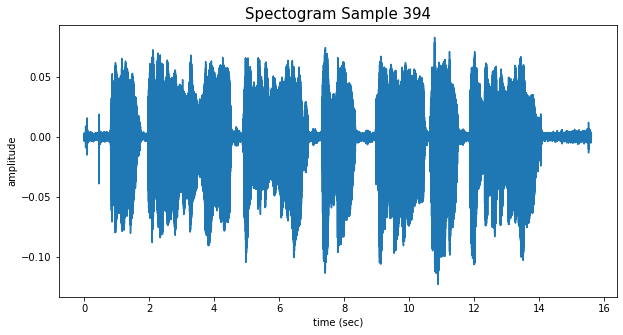

In [ ]:
n=random.randint(0, 1687)
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files_train[n],sr=fs)
t = np.arange(len(x))/fs
plt.figure(figsize=(10, 5))
plt.title(f'Spectogram Sample {n}',size=15)
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files_train[n]))

In [ ]:
x, fs = librosa.load(files_train[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 688054 samples


### **Feature Extraction:**

In [ ]:
def gety():
  y_list = []
  for file in tqdm(files_accepted):
    try:
      fs = None # if None, fs would be 22050
      x, fs = librosa.load(file,sr=fs)
      
      temp_dict = {
          'y':x,
          'fs': fs,
          'lowcut': 20,
          'file_name':file
      }
      # print(temp_dict)
      y_list.append(temp_dict)
      
    except Exception as e:
      print(str(e))
      continue

  return y_list

In [ ]:
y_list = gety()

100%|██████████| 1671/1671 [04:32<00:00,  6.12it/s]


In [ ]:
def spectral_statistics(audio_details):
  file_name = audio_details.get('file_name')
  y = audio_details.get('y')
  fs = audio_details.get('fs')
  lowcut= 40
  if True: y = y/np.max(np.abs(y))
  spec = np.abs(np.fft.rfft(y))
  freq = np.fft.rfftfreq(len(y), d=1 / fs)
  idx = int(lowcut / fs * len(freq) * 2)
  spec = np.abs(spec[idx:])
  freq = freq[idx:]

  amp = spec / spec.sum()
  mean = (freq * amp).sum()
  sd = np.sqrt(np.sum(amp * ((freq - mean) ** 2)))
  amp_cumsum = np.cumsum(amp)
  median = freq[len(amp_cumsum[amp_cumsum <= 0.5]) + 1]
  mode = freq[amp.argmax()]
  Q25 = freq[len(amp_cumsum[amp_cumsum <= 0.25]) + 1]
  Q75 = freq[len(amp_cumsum[amp_cumsum <= 0.75]) + 1]
  IQR = Q75 - Q25
  z = amp - amp.mean()
  w = amp.std()
  skew = ((z ** 3).sum() / (len(spec) - 1)) / w ** 3
  kurt = ((z ** 4).sum() / (len(spec) - 1)) / w ** 4

  specprops = {
      'file_name':file_name,
      'stat_mean': mean,
      'stat_sd': sd,
      'stat_median': median,
      'stat_mode': mode,
      'stat_Q25': Q25,
      'stat_Q75': Q75,
      'stat_IQR': IQR,
      'stat_skew': skew,
      'stat_kurt': kurt
  }

  return specprops

In [ ]:
specteral_list = []
for i in tqdm(y_list):
  data = spectral_statistics(i)
  specteral_list.append(data)

100%|██████████| 1671/1671 [08:09<00:00,  3.42it/s]


In [ ]:
feature_df = pd.DataFrame(specteral_list)
files = []
for i,r in feature_df.iterrows():
  file_name = r['file_name'].split('/')[-1]
  files.append(file_name)

feature_df['files'] = files

In [ ]:
feature_df.rename({'file_name': 'file_path', 'files': 'file_name'}, axis=1, inplace=True)
feature_df

,file_path,stat_mean,stat_sd,stat_median,stat_mode,stat_Q25,stat_Q75,stat_IQR,stat_skew,stat_kurt,file_name
0,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1398.359140,3216.294193,398.762590,114.773902,222.796399,899.410035,676.613636,12.090067,192.929134,S1_hum_2_Hakuna.wav
1,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1198.337271,3348.980597,198.766937,196.915710,177.580671,458.487239,280.906568,31.512051,1314.785558,S1_hum_2_Mamma.wav
2,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1458.302438,3188.379408,492.487877,204.525053,230.494516,1221.496677,991.002161,9.278507,114.048629,S1_hum_1_Showman.wav
3,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1250.289702,3101.558412,347.806903,205.043712,200.033365,695.550385,495.517020,19.676002,574.588519,S1_hum_2_Frozen.wav
4,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1398.804035,3269.697869,465.339095,117.361612,239.072188,857.953856,618.881668,10.030732,136.276234,S1_hum_2_Potter.wav
...,...,...,...,...,...,...,...,...,...,...,...
1666,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1079.288756,1658.341294,532.681904,519.305594,405.522302,927.254821,521.732520,15.599894,314.670285,S86_hum_2_Potter.wav
1667,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1284.109672,1941.094412,414.954371,297.081338,297.384978,1764.026720,1466.641742,18.700741,525.163522,S86_hum_3_StarWars.wav
1668,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1330.673249,1628.231699,781.183173,293.977865,520.353340,1531.177804,1010.824464,9.493279,137.324770,S86_hum_4_StarWars.wav
1669,/content/drive/MyDrive/Data/MLEndHW/Task2/Trai...,1327.460893,2359.798641,385.047165,311.848095,202.484004,1568.732956,1366.248952,23.093674,740.007749,S86_hum_2_Panther.wav


In [ ]:
feature_final_df = pd.merge(datafiles, feature_df, on=['file_name'])

In [ ]:
feature_final_df = feature_final_df.rename({'Gender':'label'}, axis=1)

In [ ]:
feature_final_df.drop('file_path_y', axis=1, inplace=True)
feature_final_df.drop('file_path_x', axis=1, inplace=True)
feature_final_df.drop('Language2', axis=1, inplace=True)
feature_final_df.drop('number', axis=1, inplace=True)
feature_final_df.drop('interpretation', axis=1, inplace=True)
feature_final_df.drop('file_name', axis=1, inplace=True)
feature_final_df.drop('Nationality', axis=1, inplace=True)
feature_final_df.drop('Coordinates', axis=1, inplace=True)
feature_final_df.drop('Age', axis=1, inplace=True)
feature_final_df.drop('Language1', axis=1, inplace=True)
feature_final_df.drop('song', axis=1, inplace=True)

In [ ]:
feature_final_df

,label,stat_mean,stat_sd,stat_median,stat_mode,stat_Q25,stat_Q75,stat_IQR,stat_skew,stat_kurt
0,Male,1398.359140,3216.294193,398.762590,114.773902,222.796399,899.410035,676.613636,12.090067,192.929134
1,Male,1198.337271,3348.980597,198.766937,196.915710,177.580671,458.487239,280.906568,31.512051,1314.785558
2,Male,1458.302438,3188.379408,492.487877,204.525053,230.494516,1221.496677,991.002161,9.278507,114.048629
3,Male,1250.289702,3101.558412,347.806903,205.043712,200.033365,695.550385,495.517020,19.676002,574.588519
4,Male,1398.804035,3269.697869,465.339095,117.361612,239.072188,857.953856,618.881668,10.030732,136.276234
...,...,...,...,...,...,...,...,...,...,...
1666,Female,1079.288756,1658.341294,532.681904,519.305594,405.522302,927.254821,521.732520,15.599894,314.670285
1667,Female,1284.109672,1941.094412,414.954371,297.081338,297.384978,1764.026720,1466.641742,18.700741,525.163522
1668,Female,1330.673249,1628.231699,781.183173,293.977865,520.353340,1531.177804,1010.824464,9.493279,137.324770
1669,Female,1327.460893,2359.798641,385.047165,311.848095,202.484004,1568.732956,1366.248952,23.093674,740.007749


**Preparing the Labels with LabelEncoder:**

In [ ]:
voice = feature_final_df
le = LabelEncoder()
voice["label"] = le.fit_transform(voice["label"])
le.classes_

array(['Female', 'Male'], dtype=object)

## **Scaling the feature data:**

The extracted features are then Normalized (MinMaxScaler).

Normalization (MinMaxScalar) scales each input variable separately to the range 0-1, which is the range for floating-point values where we have the most precision.

In [ ]:
voice[:]=MinMaxScaler().fit_transform(voice)

cols = voice.columns.tolist()
cols
cols = [
 'stat_mean',
 'stat_sd',
 'stat_median',
 'stat_mode',
 'stat_Q25',
 'stat_Q75',
 'stat_IQR',
 'stat_skew',
 'stat_kurt',
 'label']
voice = voice[cols]

voice.head()

,stat_mean,stat_sd,stat_median,stat_mode,stat_Q25,stat_Q75,stat_IQR,stat_skew,stat_kurt,label
0,0.141032,0.355816,0.066776,0.061919,0.112602,0.048174,0.045541,0.123577,0.026445,1.0
1,0.112681,0.376217,0.012180,0.130204,0.075530,0.017203,0.016950,0.456456,0.219679,1.0
2,0.149528,0.351524,0.092361,0.136529,0.118914,0.070798,0.068256,0.075389,0.012859,1.0
3,0.120045,0.338176,0.052866,0.136961,0.093939,0.033855,0.032456,0.253595,0.092184,1.0
4,0.141095,0.364027,0.084950,0.064070,0.125947,0.045262,0.041370,0.088282,0.016687,1.0


### **Feature Selection:**

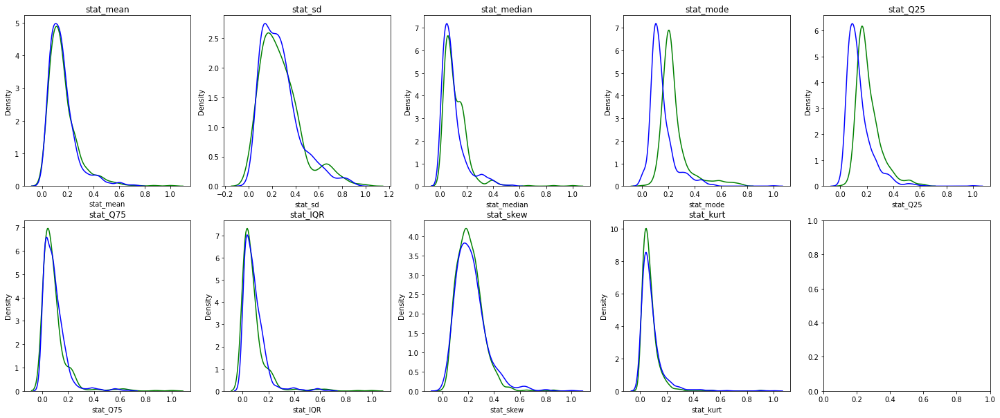

In [ ]:
plt.subplots(2,5,figsize=(25,10))
for i in range(1,10):
    plt.subplot(2,5,i)
    plt.title(voice.columns[i-1])
    sns.kdeplot(voice.loc[voice['label'] == 0, voice.columns[i-1]], color= 'green', label='F')
    sns.kdeplot(voice.loc[voice['label'] == 1, voice.columns[i-1]], color= 'blue', label='M')

In [ ]:
print("\nCorrelation coefficients:")
corr=voice.iloc[:,0:9].corr()
corr


Correlation coefficients:


,stat_mean,stat_sd,stat_median,stat_mode,stat_Q25,stat_Q75,stat_IQR,stat_skew,stat_kurt
stat_mean,1.000000,0.866093,0.573470,0.078711,0.287179,0.873501,0.865767,-0.123426,-0.040692
stat_sd,0.866093,1.000000,0.196817,-0.042156,0.011922,0.578187,0.589717,0.050486,0.058716
stat_median,0.573470,0.196817,1.000000,0.305938,0.659408,0.665418,0.618349,-0.414105,-0.229423
stat_mode,0.078711,-0.042156,0.305938,1.000000,0.717889,0.027733,-0.038746,-0.333155,-0.259595
stat_Q25,0.287179,0.011922,0.659408,0.717889,1.000000,0.277240,0.189854,-0.540532,-0.372751
stat_Q75,0.873501,0.578187,0.665418,0.027733,0.277240,1.000000,0.995961,-0.136759,-0.044254
stat_IQR,0.865767,0.589717,0.618349,-0.038746,0.189854,0.995961,1.000000,-0.089238,-0.010389
stat_skew,-0.123426,0.050486,-0.414105,-0.333155,-0.540532,-0.136759,-0.089238,1.000000,0.911414
stat_kurt,-0.040692,0.058716,-0.229423,-0.259595,-0.372751,-0.044254,-0.010389,0.911414,1.000000


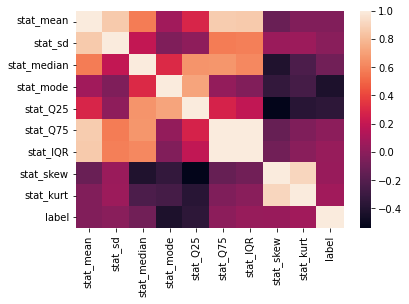

In [ ]:
sns.heatmap(corr)

### **Prepare the dataset for models:**

The data is divided as 70% training and 30% validation.

In [ ]:
train, test = train_test_split(voice, test_size=0.3)

# **8. Results:**

Results of 3 different Machine Learning algorithms are tested. Follwing are the ML algorithms used:

1. K-Nearest Neighbors Classifier

2. Random Forrest Classifier

3. Support Vector Machine (SVM) Classifier

**For training and validation**

Every model is trained and tested with 2 different Datasets and later error rate is compared for the model evaluation. **Dataset 1** containes all the features calculated in Feature Extraction Stage. **Dataset 2** contains only 'stat_Q25' and 'stat_mode'.

**Dataset 1** - All Features Considered

In [ ]:
x_train = train.iloc[:, :-1]
y_train = train["label"]
x_test = test.iloc[:, :-1]
y_test = test["label"]

**Dataset 2** - Only 'stat_Q25' and 'stat_mode' are considered

In [ ]:
x_train3 = train[["stat_Q25","stat_mode"]]
y_train3 = train["label"]
x_test3 = test[["stat_Q25","stat_mode"]]
y_test3 = test["label"]

## **Model 1: K-Nearest Neighbors Classifier**

In [ ]:
def classify(model,x_train,y_train,x_test,y_test):
    from sklearn.metrics import classification_report
    target_names = ['female', 'male']
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    print(classification_report(y_test, y_pred, target_names=target_names, digits=4))

In [ ]:
def knn_error(k,x_train,y_train,x_test,y_test):
    error_rate = []
    K=range(1,k)
    for i in K:
        knn = KNeighborsClassifier(n_neighbors = i)
        knn.fit(x_train, y_train)
        y_pred = knn.predict(x_test)
        error_rate.append(np.mean(y_pred != y_test))
    kloc = error_rate.index(min(error_rate))
    print("Lowest error is %s occurs at k=%s." % (error_rate[kloc], K[kloc]))

    plt.plot(K, error_rate, color='blue', linestyle='dashed', marker='o',
             markerfacecolor='red', markersize=10)
    plt.title('Error Rate vs. K Value')
    plt.xlabel('K')
    plt.ylabel('Error Rate')
    plt.show()
    return K[kloc]

Lowest error is 0.13147410358565736 occurs at k=5.


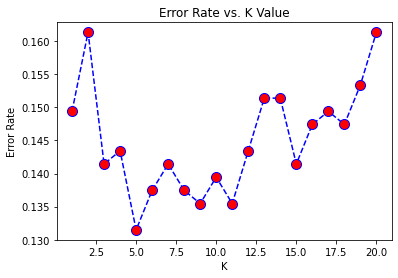

In [ ]:
k=knn_error(21,x_train,y_train,x_test,y_test)

In [ ]:
model = KNeighborsClassifier(n_neighbors = k)
classify(model,x_train,y_train,x_test,y_test)

              precision    recall  f1-score   support

      female     0.8135    0.8396    0.8263       187
        male     0.9029    0.8857    0.8942       315

    accuracy                         0.8685       502
   macro avg     0.8582    0.8626    0.8603       502
weighted avg     0.8696    0.8685    0.8689       502



Lowest error is 0.18127490039840638 occurs at k=13.


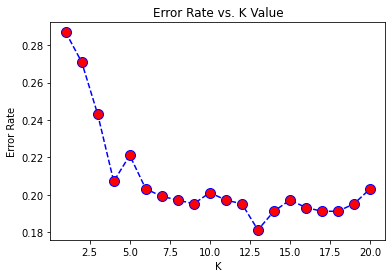

In [ ]:
k=knn_error(21,x_train3,y_train3,x_test3,y_test3)

In [ ]:
model = KNeighborsClassifier(n_neighbors = k)
classify(model,x_train,y_train,x_test,y_test)

              precision    recall  f1-score   support

      female     0.8033    0.7861    0.7946       187
        male     0.8746    0.8857    0.8801       315

    accuracy                         0.8486       502
   macro avg     0.8389    0.8359    0.8374       502
weighted avg     0.8480    0.8486    0.8483       502



## **Model 2: Random Forrest Classifier**

In [ ]:
def rf_error(n,x_train,y_train,x_test,y_test):
    error_rate = []
    e=range(1,n,20)
    for i in e:
        model = RandomForestClassifier(n_estimators = i)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        error_rate.append(np.mean(y_pred != y_test))
    nloc = error_rate.index(min(error_rate))
    print("Lowest error is %s occurs at n=%s." % (error_rate[nloc], e[nloc]))

    plt.plot(e, error_rate, color='blue', linestyle='dashed', marker='o',
             markerfacecolor='red', markersize=10)
    plt.title('Error Rate vs. n Value')
    plt.xlabel('n')
    plt.ylabel('Error Rate')
    plt.show()
    return e[nloc]

Lowest error is 0.11553784860557768 occurs at n=61.


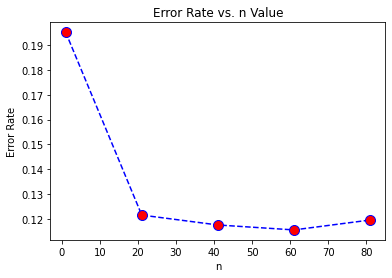

In [ ]:
e=rf_error(100,x_train,y_train,x_test,y_test)

In [ ]:
model=RandomForestClassifier(n_estimators = e)
classify(model,x_train,y_train,x_test,y_test)

              precision    recall  f1-score   support

      female     0.8402    0.8717    0.8556       187
        male     0.9221    0.9016    0.9117       315

    accuracy                         0.8904       502
   macro avg     0.8811    0.8866    0.8837       502
weighted avg     0.8916    0.8904    0.8908       502



Lowest error is 0.22310756972111553 occurs at n=41.


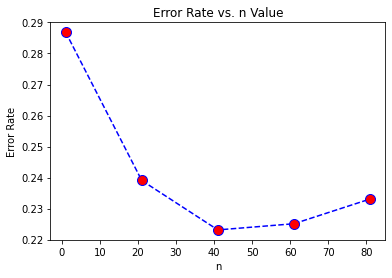

In [ ]:
e=rf_error(100,x_train3,y_train3,x_test3,y_test3)

## **Model 3: Support Vector Machine Classifier**
>(with all three kernels)



In [ ]:
def svm_kernel(x_train,y_train,x_test,y_test):
    rate=[]
    kernel=['rbf','poly','linear']
    for i in kernel:
        model = SVC(kernel=i).fit(x_train,y_train)
        y_pred=model.predict(x_train)
        print(i, ' in-sample accuracy in SVM: ', accuracy_score(y_train,y_pred))
        y_pred=model.predict(x_test)
        print(i, ' out-of-sample accuracy in SVM: ', accuracy_score(y_test,y_pred))
        rate.append(accuracy_score(y_test,y_pred))
    nloc = rate.index(max(rate))
    print("Highest accuracy is %s occurs at %s kernel." % (rate[nloc], kernel[nloc]))
    return kernel[nloc]

In [ ]:
def svm_error(k,C,x_train,y_train,x_test,y_test):
    error_rate = []
    C=range(1,C)
    for i in C:
        model = SVC(kernel=k,C=i).fit(x_train,y_train)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        error_rate.append(np.mean(y_pred != y_test))
    cloc = error_rate.index(min(error_rate))
    print("Lowest error is %s occurs at C=%s." % (error_rate[cloc], C[cloc]))

    plt.plot(C, error_rate, color='blue', linestyle='dashed', marker='o',
             markerfacecolor='red', markersize=10)
    plt.title('Error Rate vs. C Value')
    plt.xlabel('C')
    plt.ylabel('Error Rate')
    plt.show()
    return C[cloc]

In [ ]:
k = svm_kernel(x_train,y_train,x_test,y_test)

rbf  in-sample accuracy in SVM:  0.8588537211291702
rbf  out-of-sample accuracy in SVM:  0.8545816733067729
poly  in-sample accuracy in SVM:  0.8485885372112917
poly  out-of-sample accuracy in SVM:  0.8426294820717132
linear  in-sample accuracy in SVM:  0.718562874251497
linear  out-of-sample accuracy in SVM:  0.7071713147410359
Highest accuracy is 0.8545816733067729 occurs at rbf kernel.


Lowest error is 0.1254980079681275 occurs at C=6.


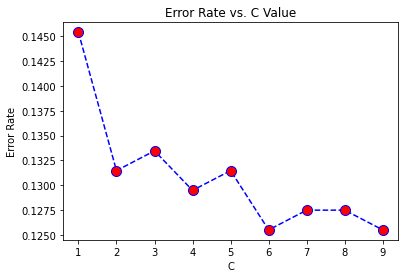

In [ ]:
c = svm_error(k,10,x_train,y_train,x_test,y_test)

In [ ]:
model = SVC(kernel=k,C=c)
classify(model,x_train,y_train,x_test,y_test)

              precision    recall  f1-score   support

      female     0.8196    0.8503    0.8346       187
        male     0.9091    0.8889    0.8989       315

    accuracy                         0.8745       502
   macro avg     0.8643    0.8696    0.8668       502
weighted avg     0.8758    0.8745    0.8749       502



In [ ]:
k = svm_kernel(x_train3,y_train3,x_test3,y_test3)

rbf  in-sample accuracy in SVM:  0.7998289136013687
rbf  out-of-sample accuracy in SVM:  0.8266932270916335
poly  in-sample accuracy in SVM:  0.6381522668947819
poly  out-of-sample accuracy in SVM:  0.6294820717131474
linear  in-sample accuracy in SVM:  0.6723695466210436
linear  out-of-sample accuracy in SVM:  0.6772908366533864
Highest accuracy is 0.8266932270916335 occurs at rbf kernel.


Lowest error is 0.17330677290836655 occurs at C=1.


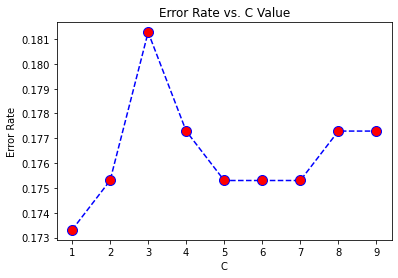

In [ ]:
c=svm_error(k,10,x_train3,y_train3,x_test3,y_test3)

In [ ]:
model = SVC(kernel=k,C=c)
classify(model,x_train3,y_train3,x_test3,y_test3)

              precision    recall  f1-score   support

      female     0.7404    0.8235    0.7797       187
        male     0.8878    0.8286    0.8571       315

    accuracy                         0.8267       502
   macro avg     0.8141    0.8261    0.8184       502
weighted avg     0.8329    0.8267    0.8283       502



# **9. Conclusion**

The purpose of this project is just to differenciate between feminine and masculine voice in order to train a model which in future can be used to differenciate any huming voice into these 2 categories. It is not meant to hurt or discriminate any gender.

### **Model Evaluation:**

Every model is trained and tested with 2 different Datasets and later error rate is compared for the model evaluation. This apporach help us understand how each model works with selected features and with reduced features. All 3 models work equally good with the feature data which can be corroborated by their accuracy and decreasing error rate.

### **Sugested Improvements:**

**Feature Extraction:** More signal processing features could be explored and extracted to possibilty improve classification perfomance based on specific problem.

**Class Balance**: Even though a balanced model was found, the data classes were relatively imbalanced. Hum files were significantly more than Whistle files. Balanced intepretation files would help improve performance.